# 1. Representación data con pandas

### 1.1. Importar libreria relevantes

In [85]:
#manejo de datos
import pandas as pd
import numpy as np

#visualizacion
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm

#librerias para modelos de machine learning
from sklearn.model_selection import train_test_split   #divide la data en entrenamiento y prueba
from sklearn.linear_model import LinearRegression      #apicar modelo de regresion lineal
from sklearn.metrics import mean_squared_error, r2_score # metricas del modelo

# almacenar modelos
import joblib

### 1.2. Abrir data

In [263]:
# leer un archivo csv, ya descargado, e imprimir la cabeza (primero 5 elementos)

In [44]:
path = r"C:\Users\darly\.cache\kagglehub\datasets\ruchi798\data-science-job-salaries\versions\1"
df = pd.read_csv(path + r"\ds_salaries.csv")


### 1.3. Exploración, filtro y limpieza de la  data

In [265]:
# ver encabezado de la data (las primeras 5 filas)
df.head()


,Unnamed: 0,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,0,2020,MI,FT,Data Scientist,70000,EUR,79833,DE,0,DE,L
1,1,2020,SE,FT,Machine Learning Scientist,260000,USD,260000,JP,0,JP,S
2,2,2020,SE,FT,Big Data Engineer,85000,GBP,109024,GB,50,GB,M
3,3,2020,MI,FT,Product Data Analyst,20000,USD,20000,HN,0,HN,S
4,4,2020,SE,FT,Machine Learning Engineer,150000,USD,150000,US,50,US,L


In [266]:
# mostrar las ultimas 5 lineas, filas o registros
df.tail()

,Unnamed: 0,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
602,602,2022,SE,FT,Data Engineer,154000,USD,154000,US,100,US,M
603,603,2022,SE,FT,Data Engineer,126000,USD,126000,US,100,US,M
604,604,2022,SE,FT,Data Analyst,129000,USD,129000,US,0,US,M
605,605,2022,SE,FT,Data Analyst,150000,USD,150000,US,100,US,M
606,606,2022,MI,FT,AI Scientist,200000,USD,200000,IN,100,US,L


In [267]:
# para describir la data, muestra un  resumen estadístico del dataset 
df.describe()

,Unnamed: 0,work_year,salary,salary_in_usd,remote_ratio
count,607.000000,607.000000,6.070000e+02,607.000000,607.00000
mean,303.000000,2021.405272,3.240001e+05,112297.869852,70.92257
std,175.370085,0.692133,1.544357e+06,70957.259411,40.70913
min,0.000000,2020.000000,4.000000e+03,2859.000000,0.00000
25%,151.500000,2021.000000,7.000000e+04,62726.000000,50.00000
50%,303.000000,2022.000000,1.150000e+05,101570.000000,100.00000
75%,454.500000,2022.000000,1.650000e+05,150000.000000,100.00000
max,606.000000,2022.000000,3.040000e+07,600000.000000,100.00000


In [268]:
# muestra una lista con todas las columnas que tiene el data frame
df.columns

Index(['Unnamed: 0', 'work_year', 'experience_level', 'employment_type',
       'job_title', 'salary', 'salary_currency', 'salary_in_usd',
       'employee_residence', 'remote_ratio', 'company_location',
       'company_size'],
      dtype='object')

In [269]:
df

,Unnamed: 0,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,0,2020,MI,FT,Data Scientist,70000,EUR,79833,DE,0,DE,L
1,1,2020,SE,FT,Machine Learning Scientist,260000,USD,260000,JP,0,JP,S
2,2,2020,SE,FT,Big Data Engineer,85000,GBP,109024,GB,50,GB,M
3,3,2020,MI,FT,Product Data Analyst,20000,USD,20000,HN,0,HN,S
4,4,2020,SE,FT,Machine Learning Engineer,150000,USD,150000,US,50,US,L
...,...,...,...,...,...,...,...,...,...,...,...,...
602,602,2022,SE,FT,Data Engineer,154000,USD,154000,US,100,US,M
603,603,2022,SE,FT,Data Engineer,126000,USD,126000,US,100,US,M
604,604,2022,SE,FT,Data Analyst,129000,USD,129000,US,0,US,M
605,605,2022,SE,FT,Data Analyst,150000,USD,150000,US,100,US,M


In [270]:
#hacer consultas especificas del dataframe

df[df.salary_in_usd > 250000]

,Unnamed: 0,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
1,1,2020,SE,FT,Machine Learning Scientist,260000,USD,260000,JP,0,JP,S
25,25,2020,EX,FT,Director of Data Science,325000,USD,325000,US,100,US,L
33,33,2020,MI,FT,Research Scientist,450000,USD,450000,US,0,US,M
63,63,2020,SE,FT,Data Scientist,412000,USD,412000,US,100,US,L
78,78,2021,MI,CT,ML Engineer,270000,USD,270000,US,100,US,L
93,93,2021,SE,FT,Lead Data Engineer,276000,USD,276000,US,0,US,L
97,97,2021,MI,FT,Financial Data Analyst,450000,USD,450000,US,100,US,L
157,157,2021,MI,FT,Applied Machine Learning Scientist,423000,USD,423000,US,50,US,L
225,225,2021,EX,CT,Principal Data Scientist,416000,USD,416000,US,100,US,S
231,231,2021,SE,FT,ML Engineer,256000,USD,256000,US,100,US,S


In [271]:
df[df.salary_in_usd > 250000].describe() #la descripción  salarios mayores a 250.000

,Unnamed: 0,work_year,salary,salary_in_usd,remote_ratio
count,16.00000,16.000000,16.000000,16.000000,16.000000
mean,233.06250,2021.062500,360837.500000,360837.500000,78.125000
std,197.70364,0.771902,97733.221066,97733.221066,40.697051
min,1.00000,2020.000000,256000.000000,256000.000000,0.000000
25%,74.25000,2020.750000,269100.000000,269100.000000,87.500000
50%,191.00000,2021.000000,352500.000000,352500.000000,100.000000
75%,432.50000,2022.000000,417750.000000,417750.000000,100.000000
max,534.00000,2022.000000,600000.000000,600000.000000,100.000000


In [272]:
#los valores de cierto campo determinado
df.job_title

0                  Data Scientist
1      Machine Learning Scientist
2               Big Data Engineer
3            Product Data Analyst
4       Machine Learning Engineer
                  ...            
602                 Data Engineer
603                 Data Engineer
604                  Data Analyst
605                  Data Analyst
606                  AI Scientist
Name: job_title, Length: 607, dtype: object

In [273]:
# hacer una consulta tipo QUERY
df.query("job_title == 'Data Scientist'") #RECUERDE QUE LA CONSULTA QUERY DEBE SER DENTRO DE UNA CADENA

,Unnamed: 0,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,0,2020,MI,FT,Data Scientist,70000,EUR,79833,DE,0,DE,L
7,7,2020,MI,FT,Data Scientist,11000000,HUF,35735,HU,50,HU,L
10,10,2020,EN,FT,Data Scientist,45000,EUR,51321,FR,0,FR,S
11,11,2020,MI,FT,Data Scientist,3000000,INR,40481,IN,0,IN,L
12,12,2020,EN,FT,Data Scientist,35000,EUR,39916,FR,0,FR,M
...,...,...,...,...,...,...,...,...,...,...,...,...
592,592,2022,SE,FT,Data Scientist,230000,USD,230000,US,100,US,M
593,593,2022,SE,FT,Data Scientist,150000,USD,150000,US,100,US,M
596,596,2022,SE,FT,Data Scientist,210000,USD,210000,US,100,US,M
598,598,2022,MI,FT,Data Scientist,160000,USD,160000,US,100,US,M


In [274]:
# las filas determinadas
df.iloc[20:40]

,Unnamed: 0,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
20,20,2020,MI,FT,Machine Learning Engineer,299000,CNY,43331,CN,0,CN,M
21,21,2020,MI,FT,Product Data Analyst,450000,INR,6072,IN,100,IN,L
22,22,2020,SE,FT,Data Engineer,42000,EUR,47899,GR,50,GR,L
23,23,2020,MI,FT,BI Data Analyst,98000,USD,98000,US,0,US,M
24,24,2020,MI,FT,Lead Data Scientist,115000,USD,115000,AE,0,AE,L
25,25,2020,EX,FT,Director of Data Science,325000,USD,325000,US,100,US,L
26,26,2020,EN,FT,Research Scientist,42000,USD,42000,NL,50,NL,L
27,27,2020,SE,FT,Data Engineer,720000,MXN,33511,MX,0,MX,S
28,28,2020,EN,CT,Business Data Analyst,100000,USD,100000,US,100,US,L
29,29,2020,SE,FT,Machine Learning Manager,157000,CAD,117104,CA,50,CA,L


In [275]:
#columnas especificas de una dataframe
df[["job_title", "salary"]]

,job_title,salary
0,Data Scientist,70000
1,Machine Learning Scientist,260000
2,Big Data Engineer,85000
3,Product Data Analyst,20000
4,Machine Learning Engineer,150000
...,...,...
602,Data Engineer,154000
603,Data Engineer,126000
604,Data Analyst,129000
605,Data Analyst,150000


In [276]:
'''otra forma es con la estructura iloc, pero no dando nombres sino posiciones 
recordar que la primera posicion es filas las demÁs columnas)'''

df.iloc[:, [2,4,5]]

,experience_level,job_title,salary
0,MI,Data Scientist,70000
1,SE,Machine Learning Scientist,260000
2,SE,Big Data Engineer,85000
3,MI,Product Data Analyst,20000
4,SE,Machine Learning Engineer,150000
...,...,...,...
602,SE,Data Engineer,154000
603,SE,Data Engineer,126000
604,SE,Data Analyst,129000
605,SE,Data Analyst,150000


In [277]:
# columnas determinadas y filas determinadas (estas ultimas son las primeras)
df.iloc[10:40, [2,4,5]]

,experience_level,job_title,salary
10,EN,Data Scientist,45000
11,MI,Data Scientist,3000000
12,EN,Data Scientist,35000
13,MI,Lead Data Analyst,87000
14,MI,Data Analyst,85000
15,MI,Data Analyst,8000
16,EN,Data Engineer,4450000
17,SE,Big Data Engineer,100000
18,EN,Data Science Consultant,423000
19,MI,Lead Data Engineer,56000


In [278]:
# las columnas con nombres y no por posicion, desde una a otra
df.loc[:,"experience_level": "job_title"]

,experience_level,employment_type,job_title
0,MI,FT,Data Scientist
1,SE,FT,Machine Learning Scientist
2,SE,FT,Big Data Engineer
3,MI,FT,Product Data Analyst
4,SE,FT,Machine Learning Engineer
...,...,...,...
602,SE,FT,Data Engineer
603,SE,FT,Data Engineer
604,SE,FT,Data Analyst
605,SE,FT,Data Analyst


In [279]:
#otra forma de consultar, parecido al query
df.loc[df["experience_level"]== "MI"]

,Unnamed: 0,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,0,2020,MI,FT,Data Scientist,70000,EUR,79833,DE,0,DE,L
3,3,2020,MI,FT,Product Data Analyst,20000,USD,20000,HN,0,HN,S
7,7,2020,MI,FT,Data Scientist,11000000,HUF,35735,HU,50,HU,L
8,8,2020,MI,FT,Business Data Analyst,135000,USD,135000,US,100,US,L
11,11,2020,MI,FT,Data Scientist,3000000,INR,40481,IN,0,IN,L
...,...,...,...,...,...,...,...,...,...,...,...,...
567,567,2022,MI,FT,Data Analyst,50000,GBP,65438,GB,0,GB,M
586,586,2022,MI,FT,Data Analyst,35000,GBP,45807,GB,0,GB,M
598,598,2022,MI,FT,Data Scientist,160000,USD,160000,US,100,US,M
599,599,2022,MI,FT,Data Scientist,130000,USD,130000,US,100,US,M


In [280]:
# columnas especifica  en una consulta de comparación
df.loc[df["experience_level"]== "MI", ["job_title",	"salary"]] 

,job_title,salary
0,Data Scientist,70000
3,Product Data Analyst,20000
7,Data Scientist,11000000
8,Business Data Analyst,135000
11,Data Scientist,3000000
...,...,...
567,Data Analyst,50000
586,Data Analyst,35000
598,Data Scientist,160000
599,Data Scientist,130000


In [281]:
# ordenar consulta de forma ascendente
df.loc[df["experience_level"]== "MI", ["job_title",	"salary"]].sort_values("salary", ascending=True)


,job_title,salary
185,Data Engineer,4000
15,Data Analyst,8000
184,Machine Learning Scientist,12000
192,Big Data Engineer,18000
208,Data Engineer,20000
...,...,...
136,ML Engineer,7000000
137,ML Engineer,8500000
7,Data Scientist,11000000
102,BI Data Analyst,11000000


In [282]:
#cambiar el nombre de una columna
df.rename(columns= {"salary": "salario"})

,Unnamed: 0,work_year,experience_level,employment_type,job_title,salario,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,0,2020,MI,FT,Data Scientist,70000,EUR,79833,DE,0,DE,L
1,1,2020,SE,FT,Machine Learning Scientist,260000,USD,260000,JP,0,JP,S
2,2,2020,SE,FT,Big Data Engineer,85000,GBP,109024,GB,50,GB,M
3,3,2020,MI,FT,Product Data Analyst,20000,USD,20000,HN,0,HN,S
4,4,2020,SE,FT,Machine Learning Engineer,150000,USD,150000,US,50,US,L
...,...,...,...,...,...,...,...,...,...,...,...,...
602,602,2022,SE,FT,Data Engineer,154000,USD,154000,US,100,US,M
603,603,2022,SE,FT,Data Engineer,126000,USD,126000,US,100,US,M
604,604,2022,SE,FT,Data Analyst,129000,USD,129000,US,0,US,M
605,605,2022,SE,FT,Data Analyst,150000,USD,150000,US,100,US,M


In [283]:
df

,Unnamed: 0,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,0,2020,MI,FT,Data Scientist,70000,EUR,79833,DE,0,DE,L
1,1,2020,SE,FT,Machine Learning Scientist,260000,USD,260000,JP,0,JP,S
2,2,2020,SE,FT,Big Data Engineer,85000,GBP,109024,GB,50,GB,M
3,3,2020,MI,FT,Product Data Analyst,20000,USD,20000,HN,0,HN,S
4,4,2020,SE,FT,Machine Learning Engineer,150000,USD,150000,US,50,US,L
...,...,...,...,...,...,...,...,...,...,...,...,...
602,602,2022,SE,FT,Data Engineer,154000,USD,154000,US,100,US,M
603,603,2022,SE,FT,Data Engineer,126000,USD,126000,US,100,US,M
604,604,2022,SE,FT,Data Analyst,129000,USD,129000,US,0,US,M
605,605,2022,SE,FT,Data Analyst,150000,USD,150000,US,100,US,M


In [284]:
# borrar columnas
df.drop(columns={"salary"})

,Unnamed: 0,work_year,experience_level,employment_type,job_title,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,0,2020,MI,FT,Data Scientist,EUR,79833,DE,0,DE,L
1,1,2020,SE,FT,Machine Learning Scientist,USD,260000,JP,0,JP,S
2,2,2020,SE,FT,Big Data Engineer,GBP,109024,GB,50,GB,M
3,3,2020,MI,FT,Product Data Analyst,USD,20000,HN,0,HN,S
4,4,2020,SE,FT,Machine Learning Engineer,USD,150000,US,50,US,L
...,...,...,...,...,...,...,...,...,...,...,...
602,602,2022,SE,FT,Data Engineer,USD,154000,US,100,US,M
603,603,2022,SE,FT,Data Engineer,USD,126000,US,100,US,M
604,604,2022,SE,FT,Data Analyst,USD,129000,US,0,US,M
605,605,2022,SE,FT,Data Analyst,USD,150000,US,100,US,M


In [285]:
# agregar una nueva columna o modificarla
df["salario en pesos"] = df.salary * 4500
df

,Unnamed: 0,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size,salario en pesos
0,0,2020,MI,FT,Data Scientist,70000,EUR,79833,DE,0,DE,L,315000000
1,1,2020,SE,FT,Machine Learning Scientist,260000,USD,260000,JP,0,JP,S,1170000000
2,2,2020,SE,FT,Big Data Engineer,85000,GBP,109024,GB,50,GB,M,382500000
3,3,2020,MI,FT,Product Data Analyst,20000,USD,20000,HN,0,HN,S,90000000
4,4,2020,SE,FT,Machine Learning Engineer,150000,USD,150000,US,50,US,L,675000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
602,602,2022,SE,FT,Data Engineer,154000,USD,154000,US,100,US,M,693000000
603,603,2022,SE,FT,Data Engineer,126000,USD,126000,US,100,US,M,567000000
604,604,2022,SE,FT,Data Analyst,129000,USD,129000,US,0,US,M,580500000
605,605,2022,SE,FT,Data Analyst,150000,USD,150000,US,100,US,M,675000000


In [286]:
# obtener muestras aleatorias
df.sample(frac=0.5) #fragmento deel 50 por ciento de los datos

,Unnamed: 0,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size,salario en pesos
475,475,2022,MI,FT,Data Scientist,70000,GBP,91614,GB,0,GB,M,315000000
436,436,2022,MI,FT,Data Engineer,60000,EUR,65949,ES,100,ES,M,270000000
458,458,2022,MI,FT,Business Data Analyst,1400000,INR,18442,IN,100,IN,M,6300000000
434,434,2022,MI,FT,Data Engineer,80000,GBP,104702,GB,100,GB,M,360000000
374,374,2022,MI,FT,ETL Developer,50000,EUR,54957,GR,0,GR,M,225000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
64,64,2020,SE,FT,Machine Learning Engineer,40000,EUR,45618,HR,100,HR,S,180000000
223,223,2021,MI,FT,Data Scientist,40900,GBP,56256,GB,50,GB,L,184050000
606,606,2022,MI,FT,AI Scientist,200000,USD,200000,IN,100,US,L,900000000
47,47,2020,SE,FT,Data Engineer,188000,USD,188000,US,100,US,L,846000000


In [287]:
df.sample(n=100) #numero determinado de muestras

,Unnamed: 0,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size,salario en pesos
207,207,2021,SE,FT,Data Engineer,165000,USD,165000,US,0,US,M,742500000
182,182,2021,MI,FT,Data Engineer,22000,EUR,26005,RO,0,US,L,99000000
390,390,2022,MI,FT,Machine Learning Engineer,75000,GBP,98158,GB,0,GB,M,337500000
412,412,2022,MI,FT,Data Engineer,60000,EUR,65949,GR,100,GR,M,270000000
259,259,2021,EX,FT,Director of Data Science,120000,EUR,141846,DE,0,DE,L,540000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
58,58,2020,SE,FT,Data Scientist,120000,USD,120000,US,50,US,L,540000000
206,206,2021,SE,FT,Machine Learning Engineer,200000,USD,200000,US,100,US,L,900000000
602,602,2022,SE,FT,Data Engineer,154000,USD,154000,US,100,US,M,693000000
26,26,2020,EN,FT,Research Scientist,42000,USD,42000,NL,50,NL,L,189000000


In [288]:
# agrupar datos determinados y bajo una medida
df.groupby("job_title").mean(numeric_only=True)

,Unnamed: 0,work_year,salary,salary_in_usd,remote_ratio,salario en pesos
job_title,,,,,,
3D Computer Vision Researcher,77.000000,2021.000000,4.000000e+05,5409.000000,50.000000,1.800000e+09
AI Scientist,254.142857,2021.142857,2.905714e+05,66135.571429,78.571429,1.307571e+09
Analytics Engineer,458.250000,2022.000000,1.750000e+05,175000.000000,50.000000,7.875000e+08
Applied Data Scientist,351.600000,2021.600000,1.724000e+05,175655.000000,70.000000,7.758000e+08
Applied Machine Learning Scientist,321.000000,2021.500000,1.413500e+05,142068.750000,87.500000,6.360750e+08
BI Data Analyst,106.333333,2020.833333,1.902045e+06,74755.166667,66.666667,8.559204e+09
Big Data Architect,255.000000,2021.000000,1.250000e+05,99703.000000,50.000000,5.625000e+08
Big Data Engineer,123.125000,2020.625000,4.550000e+05,51974.000000,50.000000,2.047500e+09
Business Data Analyst,256.800000,2021.000000,3.550000e+05,76691.200000,90.000000,1.597500e+09


In [289]:
df.groupby("job_title").mean(numeric_only=True).count() #cuenta elementos de la agrupación

Unnamed: 0          50
work_year           50
salary              50
salary_in_usd       50
remote_ratio        50
salario en pesos    50
dtype: int64

In [290]:
df.groupby("job_title").agg({
    "salary": ["max", "mean"]
})  #agrupar por una columan y determinadas medidas

salary              
                                               max          mean
job_title                                                       
3D Computer Vision Researcher               400000  4.000000e+05
AI Scientist                               1335000  2.905714e+05
Analytics Engineer                          205300  1.750000e+05
Applied Data Scientist                      380000  1.724000e+05
Applied Machine Learning Scientist          423000  1.413500e+05
BI Data Analyst                           11000000  1.902045e+06
Big Data Architect                          125000  1.250000e+05
Big Data Engineer                          1672000  4.550000e+05
Business Data Analyst                      1400000  3.550000e+05
Cloud Data Engineer                         160000  1.400000e+05
Computer Vision Engineer                    180000  8.350000e+04
Computer Vision Software Engineer           150000  1.003333e+05
Data Analyst                                450000  9.660496e+04
Data Analytics Engineer                     110000  6.175000e+04
Data Analytics Lead                         405000  4.050000e+05
Data Analytics Manager                      150260  1.271343e+05
Data Architect                              266400  1.778739e+05
Data Engineer                              4450000  1.792106e+05
Data Engineering Manager                    174000  1.197998e+05
Data Science Consultant                     423000  1.227143e+05
Data Science Engineer                       159500  8.450000e+04
Data Science Manager                       7000000  1.062599e+06
Data Scientist                            30400000  5.083472e+05
Data Specialist                             165000  1.650000e+05
Director of Data Engineering                200000  1.412500e+05
Director of Data Science                    325000  1.932857e+05
ETL Developer                                50000  5.000000e+04
Finance Data Analyst                         45000  4.500000e+04
Financial Data Analyst                      450000  2.750000e+05
Head of Data                                235000  1.564000e+05
Head of Data Science                        224000  1.467188e+05
Head of Machine Learning                   6000000  6.000000e+06
Lead Data Analyst                          1450000  5.690000e+05
Lead Data Engineer                          276000  1.403333e+05
Lead Data Scientist                        3000000  1.101667e+06
Lead Machine Learning Engineer               80000  8.000000e+04
ML Engineer                                8500000  2.676667e+06
Machine Learning Developer                  100000  1.000000e+05
Machine Learning Engineer                  4900000  2.727179e+05
Machine Learning Infrastructure Engineer    195000  9.733333e+04
Machine Learning Manager                    157000  1.570000e+05
Machine Learning Scientist                  260000  1.584125e+05
Marketing Data Analyst                       75000  7.500000e+04
NLP Engineer                                240000  2.400000e+05
Principal Data Analyst                      170000  1.225000e+05
Principal Data Engineer                     600000  3.283333e+05
Principal Data Scientist                    416000  2.067143e+05
Product Data Analyst                        450000  2.350000e+05
Research Scientist                          450000  1.104937e+05
Staff Data Scientist                        105000  1.050000e+05

In [291]:
# agrupar datos determinados y bajo una medida
df.job_title.value_counts()

job_title
Data Scientist                              143
Data Engineer                               132
Data Analyst                                 97
Machine Learning Engineer                    41
Research Scientist                           16
Data Science Manager                         12
Data Architect                               11
Machine Learning Scientist                    8
Big Data Engineer                             8
Director of Data Science                      7
AI Scientist                                  7
Principal Data Scientist                      7
Data Science Consultant                       7
Data Analytics Manager                        7
BI Data Analyst                               6
Computer Vision Engineer                      6
ML Engineer                                   6
Lead Data Engineer                            6
Applied Data Scientist                        5
Business Data Analyst                         5
Data Engineering Manager      

In [292]:
df.shape #tamaño de data

(607, 13)

In [293]:
#elementos unicos de cada columna
df.nunique()

Unnamed: 0            607
work_year               3
experience_level        4
employment_type         4
job_title              50
salary                272
salary_currency        17
salary_in_usd         369
employee_residence     57
remote_ratio            3
company_location       50
company_size            3
salario en pesos      272
dtype: int64

In [294]:
df.isnull().sum() #que datos son nulos

Unnamed: 0            0
work_year             0
experience_level      0
employment_type       0
job_title             0
salary                0
salary_currency       0
salary_in_usd         0
employee_residence    0
remote_ratio          0
company_location      0
company_size          0
salario en pesos      0
dtype: int64

# 2. Visualización de datos con Matplolib

### 2.1. Gráfico de barras

In [295]:
#las primeras 10 empleos mas comunes
top10_job_title = df['job_title'].value_counts()[:10] 

In [296]:
top10_job_title

job_title
Data Scientist                143
Data Engineer                 132
Data Analyst                   97
Machine Learning Engineer      41
Research Scientist             16
Data Science Manager           12
Data Architect                 11
Machine Learning Scientist      8
Big Data Engineer               8
Director of Data Science        7
Name: count, dtype: int64

**Lineas de codificación**
* px.bar(...): Crea un gráfico de barras.
* x=top10_job_title.index: Usa los títulos de trabajo (índices de la serie) como el eje X.
* y=top10_job_title.values: Usa la cantidad de veces que aparecen los títulos como eje Y.
* color=top10_job_title.index: Asigna diferentes colores a cada categoría (título de trabajo).
* color_discrete_sequence=px.colors.sequential.PuBuGn: Usa una paleta de colores predefinida (PuBuGn).
* text=top10_job_title.values: Muestra los valores sobre las barras.
* title='2.1.2. Top 10 Job Titles': Agrega un título al gráfico.
* template='plotly_dark': Usa un tema oscuro para el diseño.

In [297]:
fig = px.bar(y=top10_job_title.values, 
             x=top10_job_title.index, 
             color = top10_job_title.index,
             color_discrete_sequence=px.colors.sequential.PuBuGn,
             text=top10_job_title.values,
             title= 'Top 10 Job Titles',
             template= 'plotly_dark')
fig.show()


El método update_layout() se usa para modificar el diseño del gráfico. Aquí está lo que hace cada argumento:

* xaxis_title="Job Titles" : Cambia el título del eje X a "Job Titles" (Títulos de Trabajo).
y Este eje representa las categorías (diferentes títulos de trabajo).

*yaxis_title="count" : Cambia el título del eje Y a "count" (Cantidad).
Este eje muestra la frecuencia de cada título de trabajo en los datos.

* font=dict(size=17, family="Franklin Gothic") Ajusta el tamaño y la fuente del texto en el gráfico.
size=17: Aumenta el tamaño del texto a 17 puntos.
family="Franklin Gothic": Usa la fuente "Franklin Gothic" para los textos.

In [298]:
fig.update_layout(
    xaxis_title="Job Titles",
    yaxis_title="count",
    font = dict(size=17,family="Franklin Gothic"))
fig.show()

### 2.2. Gráfico de tortas

work_year
2022    318
2021    217
2020     72
Name: count, dtype: int64


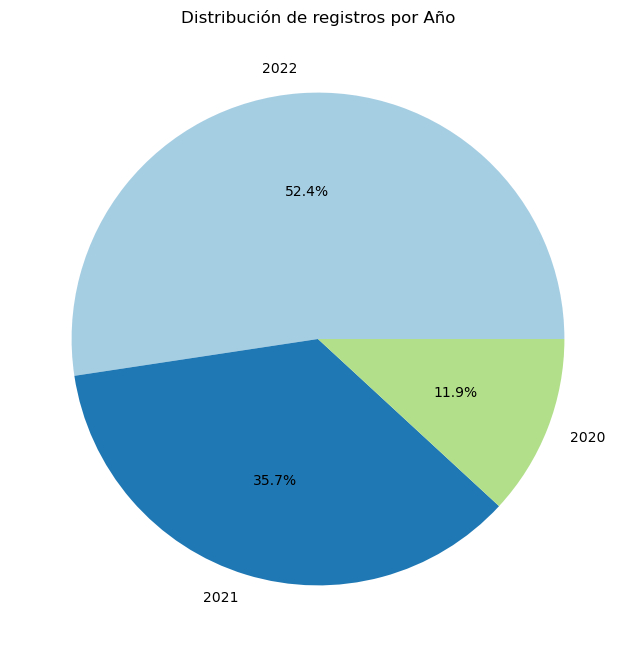

In [299]:
# Contar cuántos registros hay por año
conteo_años = df["work_year"].value_counts()
print(conteo_años)

# Crear el gráfico de torta
plt.figure(figsize=(8,8))
plt.pie(conteo_años, labels=conteo_años.index, autopct="%1.1f%%", colors=plt.cm.Paired.colors)

# Título y mostrar gráfico
plt.title("Distribución de registros por Año")
plt.show()

### 2.3. Gráfico de líneas o dispersión

vamos a construir un digrama de lineas por cada variable cuantitativa, sirve para ver el comportramiento de una variable en el tiempo


In [300]:
#seleccionamos solo tipo de datos numericos
df_cuant= df.select_dtypes(include=['int64', 'float64'])
df_cuant

,Unnamed: 0,work_year,salary,salary_in_usd,remote_ratio,salario en pesos
0,0,2020,70000,79833,0,315000000
1,1,2020,260000,260000,0,1170000000
2,2,2020,85000,109024,50,382500000
3,3,2020,20000,20000,0,90000000
4,4,2020,150000,150000,50,675000000
...,...,...,...,...,...,...
602,602,2022,154000,154000,100,693000000
603,603,2022,126000,126000,100,567000000
604,604,2022,129000,129000,0,580500000
605,605,2022,150000,150000,100,675000000


In [301]:
#eliminar la columna sin nombre
df_cuant= df_cuant.iloc[:, 1:]
df_cuant

,work_year,salary,salary_in_usd,remote_ratio,salario en pesos
0,2020,70000,79833,0,315000000
1,2020,260000,260000,0,1170000000
2,2020,85000,109024,50,382500000
3,2020,20000,20000,0,90000000
4,2020,150000,150000,50,675000000
...,...,...,...,...,...
602,2022,154000,154000,100,693000000
603,2022,126000,126000,100,567000000
604,2022,129000,129000,0,580500000
605,2022,150000,150000,100,675000000


In [302]:
#grafica uno por uno

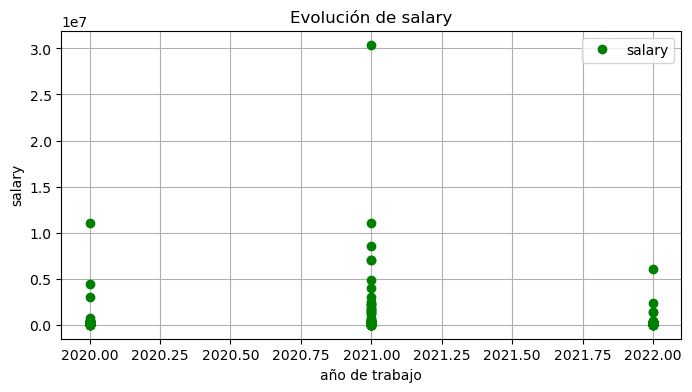

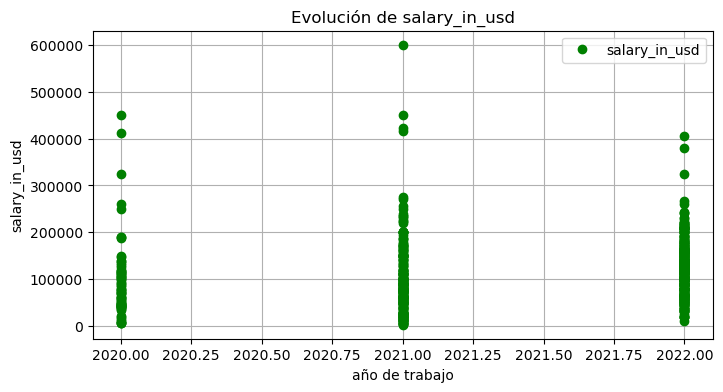

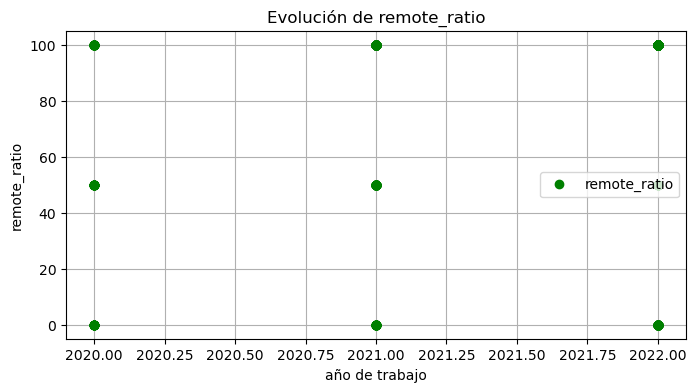

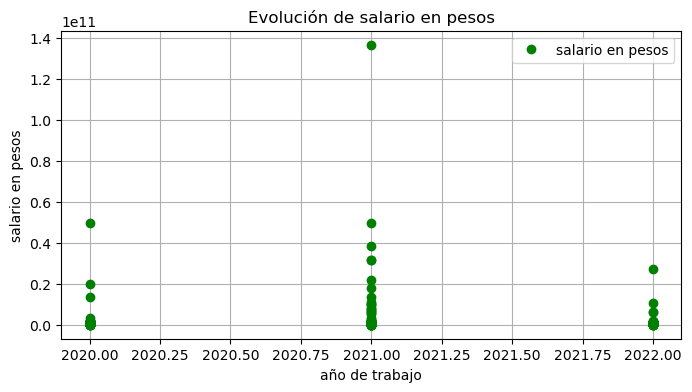

In [303]:
for i in range(1, df_cuant.shape[1]): #no toma la columna año, y va a iterar sobre el numero de columnas que es segundo espacio 
    plt.figure(figsize=(8, 4))  # Crear una nueva figura para cada gráfico
    
    plt.plot(df_cuant.work_year, df_cuant.iloc[:, i], marker="o", linestyle="",color="green", label=df_cuant.columns[i])
    
    # Personalización del gráfico
    plt.xlabel("año de trabajo")
    plt.ylabel(df_cuant.columns[i])
    plt.title(f"Evolución de {df_cuant.columns[i]}")
    plt.legend()
    plt.grid(True)
    
    plt.show()  # Mostrar cada gráf

### 4. Distribución normal

In [304]:
df_cuant= df_cuant.iloc[:,1:] #elmina de una vez la columna año
df_cuant

,salary,salary_in_usd,remote_ratio,salario en pesos
0,70000,79833,0,315000000
1,260000,260000,0,1170000000
2,85000,109024,50,382500000
3,20000,20000,0,90000000
4,150000,150000,50,675000000
...,...,...,...,...
602,154000,154000,100,693000000
603,126000,126000,100,567000000
604,129000,129000,0,580500000
605,150000,150000,100,675000000


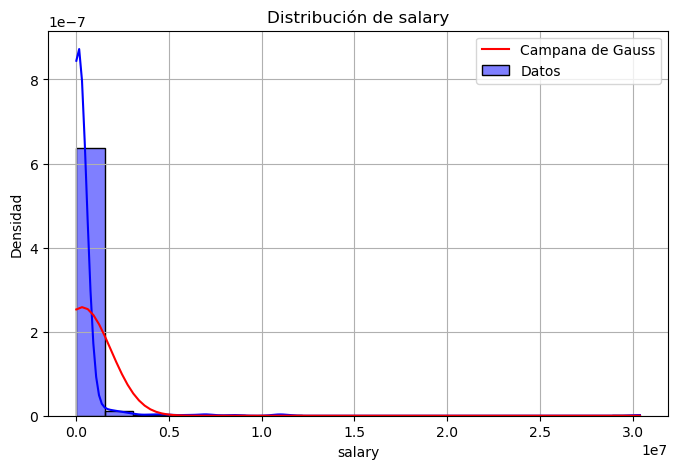

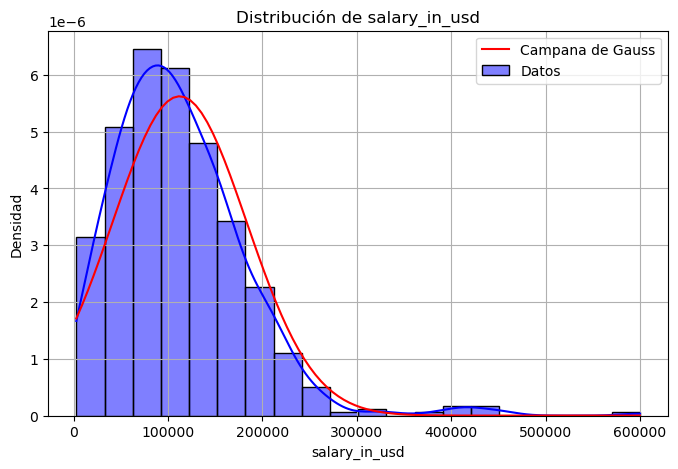

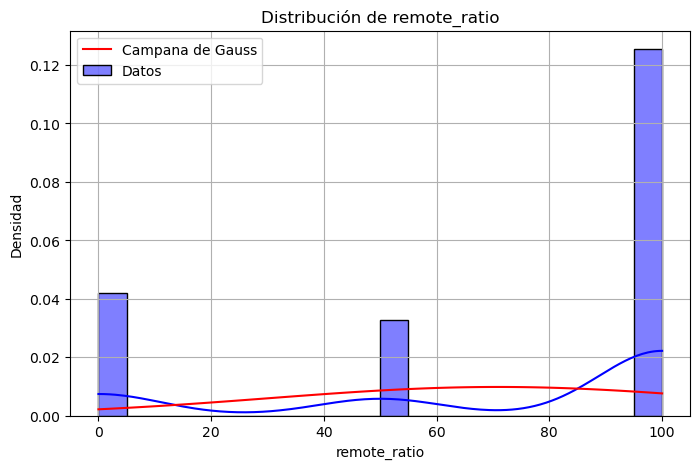

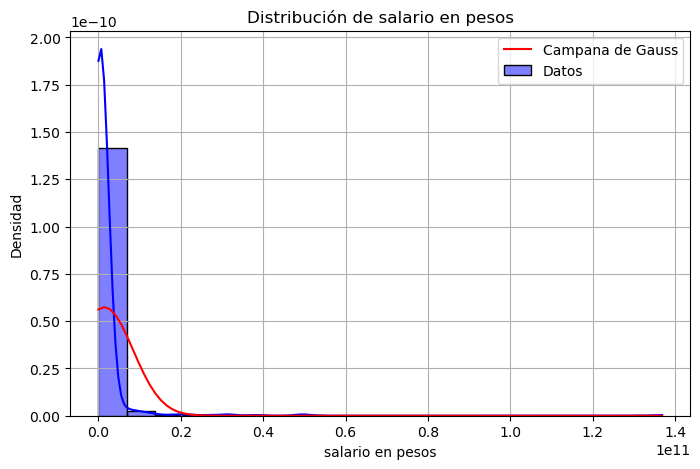

In [305]:
# Graficar cada variable numérica con su campana de Gauss
for columna in df_cuant.columns:
    plt.figure(figsize=(8, 5))  # Nueva figura para cada variable
    
    # Histograma con densidad
    sns.histplot(df_cuant[columna], kde=True, bins=20, stat="density", color="blue", label="Datos")

    # Ajuste de la curva normal teórica
    media = df_cuant[columna].mean()
    desviacion = df_cuant[columna].std()
    x = np.linspace(df_cuant[columna].min(), df_cuant[columna].max(), 100) #linea de ahuste de la cuerva
    y = norm.pdf(x, media, desviacion)
    plt.plot(x, y, color="red", label="Campana de Gauss")

    # Personalización del gráfico
    plt.title(f"Distribución de {columna}")
    plt.xlabel(columna)
    plt.ylabel("Densidad")
    plt.legend()
    plt.grid(True)

    plt.show()  # Muestra cada gráfico individualmente


### 5. Matriz de correlacion 

la correlacción entre los datos, sirve para revisar la relacion de los datos

In [306]:
correlacion = df_cuant.corr() #hallar valor de datos relacionados
correlacion

,salary,salary_in_usd,remote_ratio,salario en pesos
salary,1.000000,-0.083906,-0.014608,1.000000
salary_in_usd,-0.083906,1.000000,0.132122,-0.083906
remote_ratio,-0.014608,0.132122,1.000000,-0.014608
salario en pesos,1.000000,-0.083906,-0.014608,1.000000


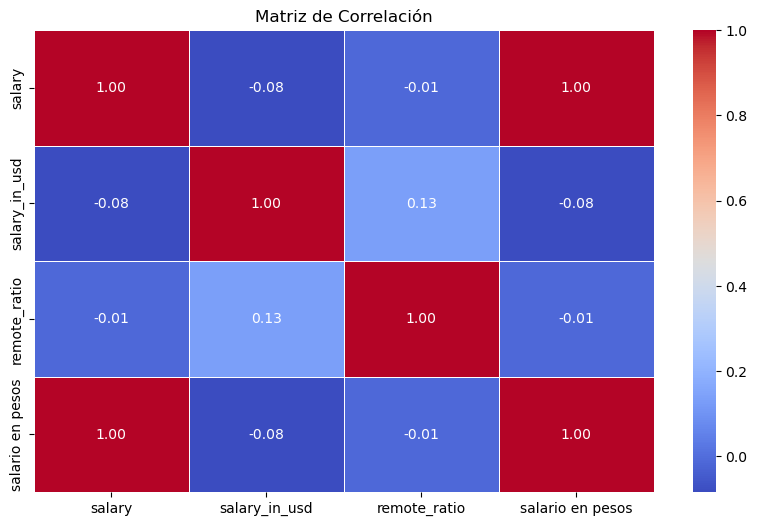

In [307]:
# graficad
correlacion = df_cuant.corr()
# 🔹 Crear el mapa de calor
plt.figure(figsize=(10, 6))  # Ajustar tamaño de la figura
sns.heatmap(correlacion, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)

# 🔹 Título del gráfico
plt.title("Matriz de Correlación")

# 🔹 Mostrar el gráfico
plt.show()

### 6. Diagrama de cajas

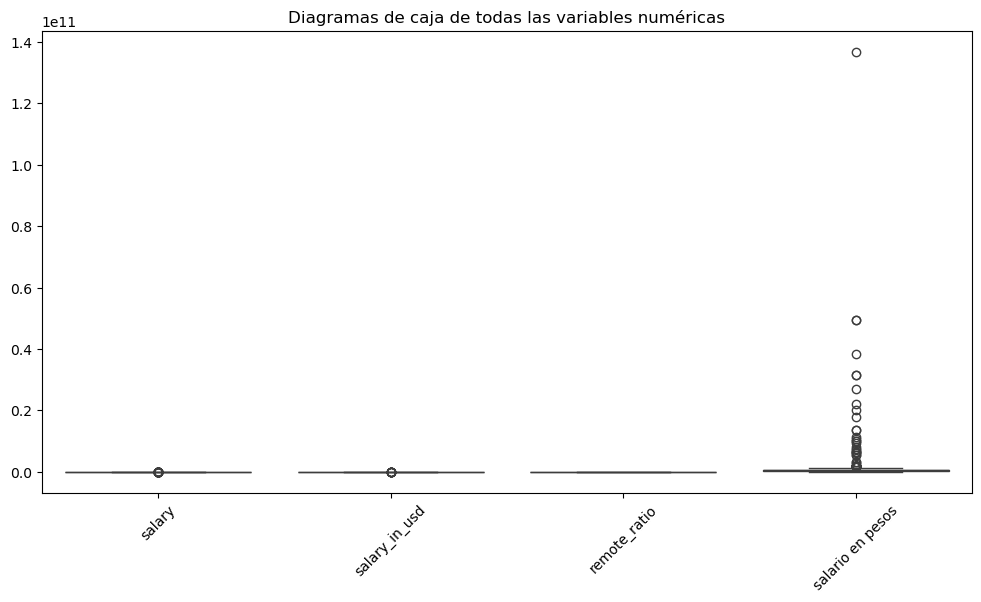

In [308]:

# 🔹 Crear un boxplot para todas las columnas numéricas
plt.figure(figsize=(12,6))  # Tamaño del gráfico
sns.boxplot(df_cuant)

# 🔹 Mejorar visualización
plt.xticks(rotation=45)  # Rotar nombres de variables
plt.title("Diagramas de caja de todas las variables numéricas")

# 🔹 Mostrar gráfico
plt.show()


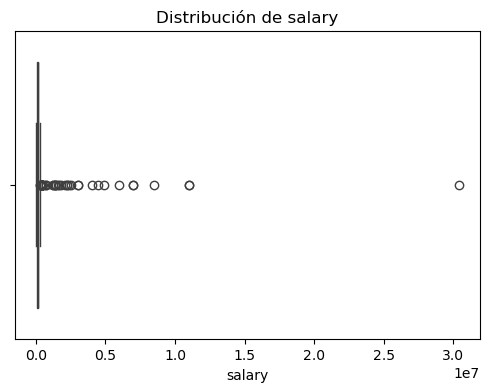

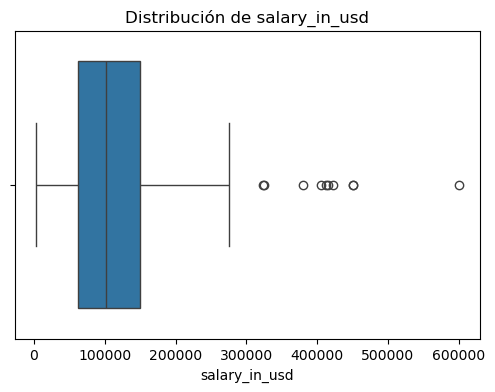

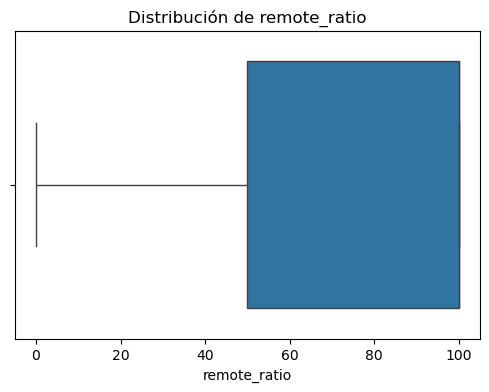

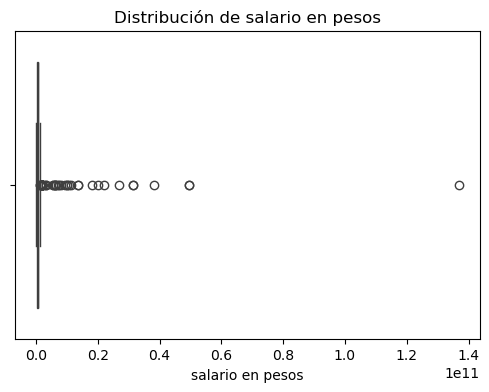

In [309]:

for i in range(0, df_cuant.shape[1]):
    plt.figure(figsize=(6,4))  # Tamaño de cada gráfico
    sns.boxplot(x=df_cuant.iloc[:, i])
    plt.title(f"Distribución de {df_cuant.columns[i]}")  # Título con el nombre de la variable
    plt.show()


In [310]:
df_cuant.describe()

,salary,salary_in_usd,remote_ratio,salario en pesos
count,6.070000e+02,607.000000,607.00000,6.070000e+02
mean,3.240001e+05,112297.869852,70.92257,1.458000e+09
std,1.544357e+06,70957.259411,40.70913,6.949609e+09
min,4.000000e+03,2859.000000,0.00000,1.800000e+07
25%,7.000000e+04,62726.000000,50.00000,3.150000e+08
50%,1.150000e+05,101570.000000,100.00000,5.175000e+08
75%,1.650000e+05,150000.000000,100.00000,7.425000e+08
max,3.040000e+07,600000.000000,100.00000,1.368000e+11


### 7. Diagrama de nulos

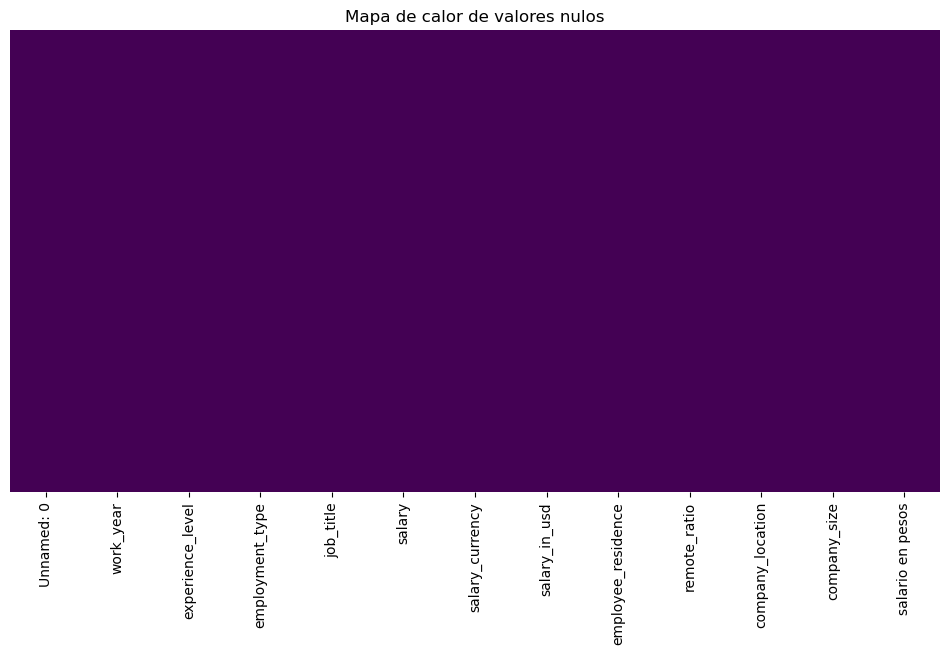

In [311]:
#valores nulos en toda la data
plt.figure(figsize=(12,6)) 
sns.heatmap(df.isnull(), cmap="viridis", cbar=False, yticklabels=False)
plt.title("Mapa de calor de valores nulos")
plt.show()

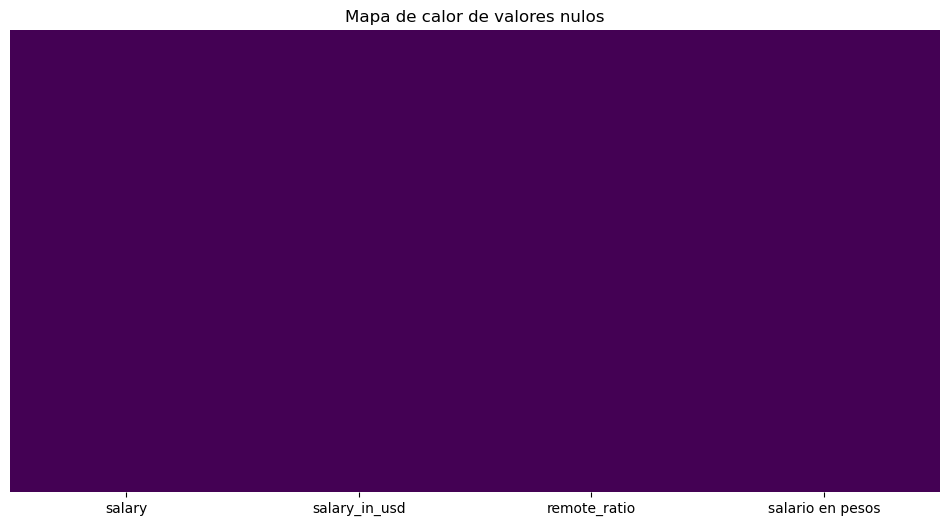

In [312]:
# nulos en  df_cuant
plt.figure(figsize=(12,6))
sns.heatmap(df_cuant.isnull(), cmap="viridis", cbar=False, yticklabels=False)
plt.title("Mapa de calor de valores nulos")
plt.show()

# 3.  Preprocesamiento adicional con la data

Ya vimos que si aplicamos una regresión lineal no será el mejor de los resultados, porque analizamos con solo variables cuantitativas, ahora vamos a medir con variables cualitativas de caracter ordinal (la unica que se puede). Entonces tenemos que convertir datos categoricos en números. 

### 3.1. Eliminar columnas irrelevantes

In [313]:
df_cuant

,salary,salary_in_usd,remote_ratio,salario en pesos
0,70000,79833,0,315000000
1,260000,260000,0,1170000000
2,85000,109024,50,382500000
3,20000,20000,0,90000000
4,150000,150000,50,675000000
...,...,...,...,...
602,154000,154000,100,693000000
603,126000,126000,100,567000000
604,129000,129000,0,580500000
605,150000,150000,100,675000000


In [314]:
df_cuant= df_cuant.drop(columns=["salario en pesos"], inplace=False) #eliminar columna mal nombrada, y creada
df_cuant

,salary,salary_in_usd,remote_ratio
0,70000,79833,0
1,260000,260000,0
2,85000,109024,50
3,20000,20000,0
4,150000,150000,50
...,...,...,...
602,154000,154000,100
603,126000,126000,100
604,129000,129000,0
605,150000,150000,100


### 3.2 Re-estructurar columnas 

El propósito de cambiar cambiar  o re-estructurar variable es revisar si se hacen cambios en sus comportamientos, posteriori

In [315]:
df_cuant.corr()

,salary,salary_in_usd,remote_ratio
salary,1.000000,-0.083906,-0.014608
salary_in_usd,-0.083906,1.000000,0.132122
remote_ratio,-0.014608,0.132122,1.000000


Para determinar los valores únicos de cierta columna. Y luego hacer una conversion de escala, dejarlos en binario u otra transformación. 

In [316]:
df_cuant["remote_ratio"].unique() # sacar valores únicos


array([  0,  50, 100])

In [317]:
df_cuant["remote_ratio_bin"] = (df_cuant["remote_ratio"] > 50).astype(int) #onvertir a bonario dado un umbral


In [318]:
df_cuant

,salary,salary_in_usd,remote_ratio,remote_ratio_bin
0,70000,79833,0,0
1,260000,260000,0,0
2,85000,109024,50,0
3,20000,20000,0,0
4,150000,150000,50,0
...,...,...,...,...
602,154000,154000,100,1
603,126000,126000,100,1
604,129000,129000,0,0
605,150000,150000,100,1


In [319]:
df_cuant.corr # análisis de correlación, si aumento la relación 

<bound method DataFrame.corr of      salary  salary_in_usd  remote_ratio  remote_ratio_bin
0     70000          79833             0                 0
1    260000         260000             0                 0
2     85000         109024            50                 0
3     20000          20000             0                 0
4    150000         150000            50                 0
..      ...            ...           ...               ...
602  154000         154000           100                 1
603  126000         126000           100                 1
604  129000         129000             0                 0
605  150000         150000           100                 1
606  200000         200000           100                 1

[607 rows x 4 columns]>

In [320]:
df_cuant= df_cuant.drop(columns=["remote_ratio"], inplace=False )#eliminar columna que se cambió
df_cuant

,salary,salary_in_usd,remote_ratio_bin
0,70000,79833,0
1,260000,260000,0
2,85000,109024,0
3,20000,20000,0
4,150000,150000,0
...,...,...,...
602,154000,154000,1
603,126000,126000,1
604,129000,129000,0
605,150000,150000,1


### 3.3 Adicionar y re-estructurar columnas

Recordar que el próposito es predicir el salario en data science, estamos construyendo una data para ese fin, en tal caso su norte deben ser variables cuantitativas. Sin embargo, las variables que hay hasta este punto no aportarian tanto a modelos sencillo como la regresion lineal por ejemplo, para ello se debe construir una data mas robusta, por ejemplo agregar nuevas columnas que en este caso seran cualitativas pero transformadas a números para que puedan ser leidas y procesadas por el modelo. 

In [321]:
df # analizar comumnas

,Unnamed: 0,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size,salario en pesos
0,0,2020,MI,FT,Data Scientist,70000,EUR,79833,DE,0,DE,L,315000000
1,1,2020,SE,FT,Machine Learning Scientist,260000,USD,260000,JP,0,JP,S,1170000000
2,2,2020,SE,FT,Big Data Engineer,85000,GBP,109024,GB,50,GB,M,382500000
3,3,2020,MI,FT,Product Data Analyst,20000,USD,20000,HN,0,HN,S,90000000
4,4,2020,SE,FT,Machine Learning Engineer,150000,USD,150000,US,50,US,L,675000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
602,602,2022,SE,FT,Data Engineer,154000,USD,154000,US,100,US,M,693000000
603,603,2022,SE,FT,Data Engineer,126000,USD,126000,US,100,US,M,567000000
604,604,2022,SE,FT,Data Analyst,129000,USD,129000,US,0,US,M,580500000
605,605,2022,SE,FT,Data Analyst,150000,USD,150000,US,100,US,M,675000000


Vamos a tomar algunas columnas de estas, como por ejemplo "experiences_level"  y "company_location" para transformarla y agregarla a la data que se está estructurando.
La primeroa requiere orden (label/ordinal encoding, la segunda no reuqiere orden (one hot encoding)

In [322]:
df_cuant

,salary,salary_in_usd,remote_ratio_bin
0,70000,79833,0
1,260000,260000,0
2,85000,109024,0
3,20000,20000,0
4,150000,150000,0
...,...,...,...
602,154000,154000,1
603,126000,126000,1
604,129000,129000,0
605,150000,150000,1


In [323]:
df_unido = pd.concat([df_cuant, df["experience_level"], df["company_size"]], axis=1) # unir datas

In [324]:
df_unido

,salary,salary_in_usd,remote_ratio_bin,experience_level,company_size
0,70000,79833,0,MI,L
1,260000,260000,0,SE,S
2,85000,109024,0,SE,M
3,20000,20000,0,MI,S
4,150000,150000,0,SE,L
...,...,...,...,...,...
602,154000,154000,1,SE,M
603,126000,126000,1,SE,M
604,129000,129000,0,SE,M
605,150000,150000,1,SE,M


**label/ordinal encoding**

In [325]:
df_unido['experience_level'].unique() #sacar val unicos


array(['MI', 'SE', 'EN', 'EX'], dtype=object)

In [326]:
# convierte en label encoding
orden_experiencia = {
    'EN': 0,
    'MI': 1,
    'SE': 2,
    'EX': 3
}

df_unido["experience_level_tr"] = df_unido["experience_level"].map(orden_experiencia)


In [327]:
df_unido

,salary,salary_in_usd,remote_ratio_bin,experience_level,company_size,experience_level_tr
0,70000,79833,0,MI,L,1
1,260000,260000,0,SE,S,2
2,85000,109024,0,SE,M,2
3,20000,20000,0,MI,S,1
4,150000,150000,0,SE,L,2
...,...,...,...,...,...,...
602,154000,154000,1,SE,M,2
603,126000,126000,1,SE,M,2
604,129000,129000,0,SE,M,2
605,150000,150000,1,SE,M,2


In [328]:
df_unido.select_dtypes(include=['int64', 'float64']).corr()  # consultando avance de corr

,salary,salary_in_usd,remote_ratio_bin,experience_level_tr
salary,1.000000,-0.083906,-0.054272,-0.027517
salary_in_usd,-0.083906,1.000000,0.186057,0.484233
remote_ratio_bin,-0.054272,0.186057,1.000000,0.142621
experience_level_tr,-0.027517,0.484233,0.142621,1.000000


**One Hot Encoding / dummies**

In [329]:
#elimina la primera columna de las dummies para evitar multicolinealidad
df_dummies = pd.get_dummies(df_unido["company_size"], prefix="company_size", drop_first=False).astype(int)
df_dummies


,company_size_L,company_size_M,company_size_S
0,1,0,0
1,0,0,1
2,0,1,0
3,0,0,1
4,1,0,0
...,...,...,...
602,0,1,0
603,0,1,0
604,0,1,0
605,0,1,0


In [330]:
df_dummies = pd.get_dummies(df_unido["company_size"], prefix="company_size", drop_first=True).astype(int)
df_dummies

,company_size_M,company_size_S
0,0,0
1,0,1
2,1,0
3,0,1
4,0,0
...,...,...
602,1,0
603,1,0
604,1,0
605,1,0


In [331]:

df_unido = pd.concat([df_unido, df_dummies], axis=1)
df_unido

,salary,salary_in_usd,remote_ratio_bin,experience_level,company_size,experience_level_tr,company_size_M,company_size_S
0,70000,79833,0,MI,L,1,0,0
1,260000,260000,0,SE,S,2,0,1
2,85000,109024,0,SE,M,2,1,0
3,20000,20000,0,MI,S,1,0,1
4,150000,150000,0,SE,L,2,0,0
...,...,...,...,...,...,...,...,...
602,154000,154000,1,SE,M,2,1,0
603,126000,126000,1,SE,M,2,1,0
604,129000,129000,0,SE,M,2,1,0
605,150000,150000,1,SE,M,2,1,0


In [332]:
#ahora elegiremos solo las columnas codifcadas
df_unido= df_unido.select_dtypes(include=['int64', 'float64'])
df_unido.corr()

,salary,salary_in_usd,remote_ratio_bin,experience_level_tr,company_size_M,company_size_S
salary,1.000000,-0.083906,-0.054272,-0.027517,-0.123882,0.013853
salary_in_usd,-0.083906,1.000000,0.186057,0.484233,0.069999,-0.194593
remote_ratio_bin,-0.054272,0.186057,1.000000,0.142621,0.146104,-0.030721
experience_level_tr,-0.027517,0.484233,0.142621,1.000000,0.206085,-0.209945
company_size_M,-0.123882,0.069999,0.146104,0.206085,1.000000,-0.428676
company_size_S,0.013853,-0.194593,-0.030721,-0.209945,-0.428676,1.000000


**Matriz de correlación paramejor visualización**

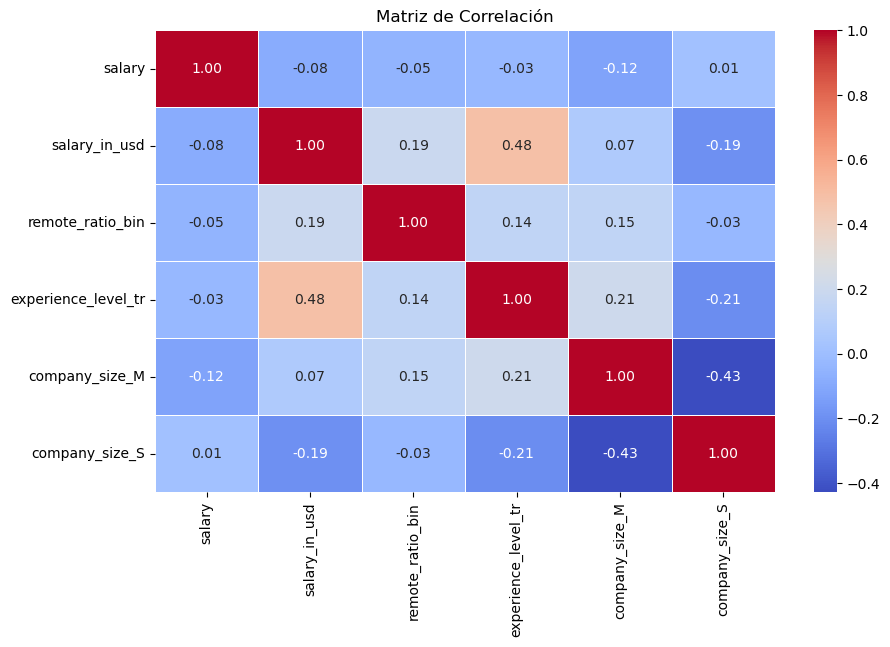

In [333]:
# graficad
correlacion = df_unido.corr()
# 🔹 Crear el mapa de calor
plt.figure(figsize=(10, 6))  # Ajustar tamaño de la figura
sns.heatmap(correlacion, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)

# 🔹 Título del gráfico
plt.title("Matriz de Correlación")

# 🔹 Mostrar el gráfico
plt.show()

**agregamos otras columnas númericas, como por ejemplo años**

In [334]:
df_unido= pd.concat([df_unido, df["work_year"]], axis=1)
df_unido

,salary,salary_in_usd,remote_ratio_bin,experience_level_tr,company_size_M,company_size_S,work_year
0,70000,79833,0,1,0,0,2020
1,260000,260000,0,2,0,1,2020
2,85000,109024,0,2,1,0,2020
3,20000,20000,0,1,0,1,2020
4,150000,150000,0,2,0,0,2020
...,...,...,...,...,...,...,...
602,154000,154000,1,2,1,0,2022
603,126000,126000,1,2,1,0,2022
604,129000,129000,0,2,1,0,2022
605,150000,150000,1,2,1,0,2022


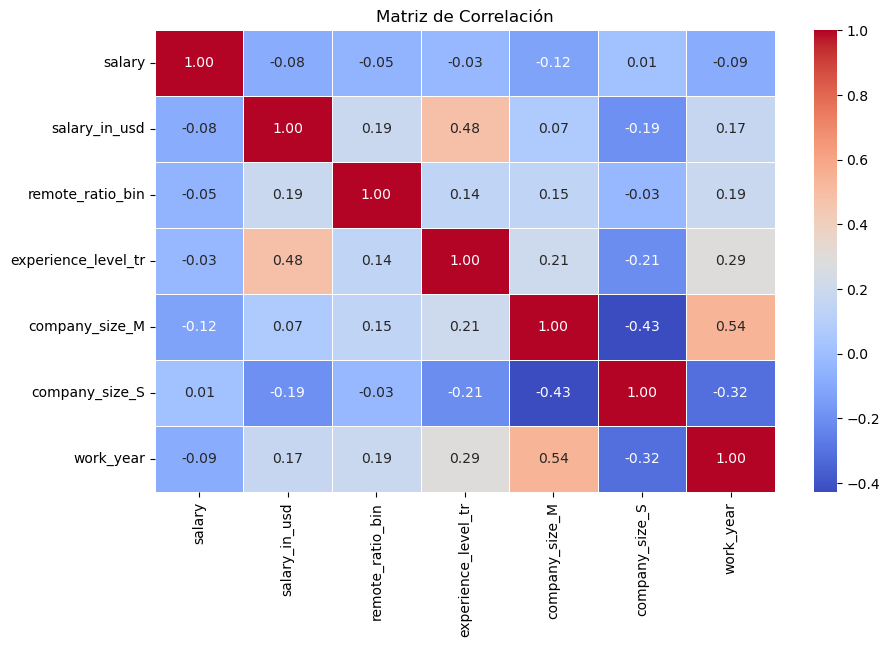

In [335]:
# graficad
correlacion = df_unido.corr()
# 🔹 Crear el mapa de calor
plt.figure(figsize=(10, 6))  # Ajustar tamaño de la figura
sns.heatmap(correlacion, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)

# 🔹 Título del gráfico
plt.title("Matriz de Correlación")

# 🔹 Mostrar el gráfico
plt.show()

In [336]:
df #revisar otras variables 

,Unnamed: 0,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size,salario en pesos
0,0,2020,MI,FT,Data Scientist,70000,EUR,79833,DE,0,DE,L,315000000
1,1,2020,SE,FT,Machine Learning Scientist,260000,USD,260000,JP,0,JP,S,1170000000
2,2,2020,SE,FT,Big Data Engineer,85000,GBP,109024,GB,50,GB,M,382500000
3,3,2020,MI,FT,Product Data Analyst,20000,USD,20000,HN,0,HN,S,90000000
4,4,2020,SE,FT,Machine Learning Engineer,150000,USD,150000,US,50,US,L,675000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
602,602,2022,SE,FT,Data Engineer,154000,USD,154000,US,100,US,M,693000000
603,603,2022,SE,FT,Data Engineer,126000,USD,126000,US,100,US,M,567000000
604,604,2022,SE,FT,Data Analyst,129000,USD,129000,US,0,US,M,580500000
605,605,2022,SE,FT,Data Analyst,150000,USD,150000,US,100,US,M,675000000


Podemos agregar la columna tipo de empleo, dada que también es una variable interesante a la hora de predecir salarios 

In [340]:
dummies_employment = pd.get_dummies(df["employment_type"], prefix="employment", drop_first=True).astype(int)
df_unido = pd.concat([df_unido, dummies_employment], axis=1)
df_unido

,salary,salary_in_usd,remote_ratio_bin,experience_level_tr,company_size_M,company_size_S,work_year,employment_FL,employment_FT,employment_PT
0,70000,79833,0,1,0,0,2020,0,1,0
1,260000,260000,0,2,0,1,2020,0,1,0
2,85000,109024,0,2,1,0,2020,0,1,0
3,20000,20000,0,1,0,1,2020,0,1,0
4,150000,150000,0,2,0,0,2020,0,1,0
...,...,...,...,...,...,...,...,...,...,...
602,154000,154000,1,2,1,0,2022,0,1,0
603,126000,126000,1,2,1,0,2022,0,1,0
604,129000,129000,0,2,1,0,2022,0,1,0
605,150000,150000,1,2,1,0,2022,0,1,0


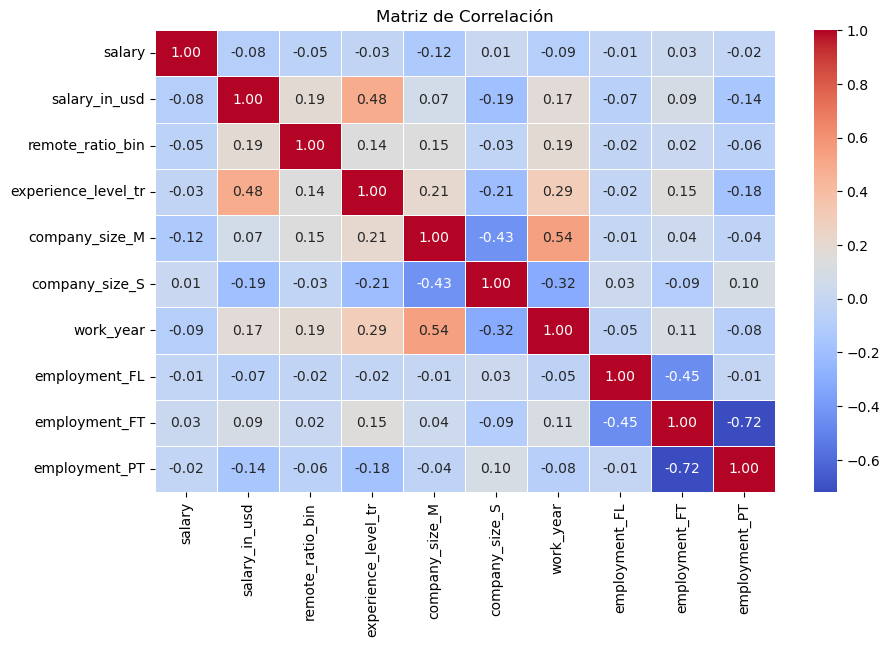

In [342]:
# graficad
correlacion = df_unido.corr()
# 🔹 Crear el mapa de calor
plt.figure(figsize=(10, 6))  # Ajustar tamaño de la figura
sns.heatmap(correlacion, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)

# 🔹 Título del gráfico
plt.title("Matriz de Correlación")

# 🔹 Mostrar el gráfico
plt.show()

### 3.4 Guardar data preprocesada

In [343]:
df_unido.to_csv(r"C:\Users\darly\OneDrive\Escritorio\IA_explorer2\dataSet\data_preprocesada_1.csv", index=False)  # index=False evita guardar los índices


# 4. Aplicar un modelo

###  4.1 Abrir data

In [3]:
data= pd.read_csv(r"C:\Users\darly\OneDrive\Escritorio\IA_explorer2\dataSet\data_preprocesada_1.csv")
data

,salary,salary_in_usd,remote_ratio_bin,experience_level_tr,company_size_M,company_size_S,work_year,employment_FL,employment_FT,employment_PT
0,70000,79833,0,1,0,0,2020,0,1,0
1,260000,260000,0,2,0,1,2020,0,1,0
2,85000,109024,0,2,1,0,2020,0,1,0
3,20000,20000,0,1,0,1,2020,0,1,0
4,150000,150000,0,2,0,0,2020,0,1,0
...,...,...,...,...,...,...,...,...,...,...
602,154000,154000,1,2,1,0,2022,0,1,0
603,126000,126000,1,2,1,0,2022,0,1,0
604,129000,129000,0,2,1,0,2022,0,1,0
605,150000,150000,1,2,1,0,2022,0,1,0


### 4.2 Seleccionar variables

In [15]:
# Seleccionar la variable independiente (X) y la dependiente (y)
X = data[["experience_level_tr"]] # Variable predictora, doble corchete para que retorno data frame y entre en el modelo
y = data['salary_in_usd']  # Variable objetivo da una serie
(X.shape), (y.shape)

((607, 1), (607,))

### 4.3 Dividir data

**Partir la data en sets de entranamiento y prueba
80% para entrenar el modelo
20% para evaluar su desempeño**

In [18]:
# random_state se usa para fijar la semilla del generador aleatorio, asegurando que los resultados sean reproducibles.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

((485, 1), (122, 1), (485,), (122,))

### 4.4 Crear un modelo y entrenar

In [20]:
 # Crear el modelo
modelo = LinearRegression()

# Entrenar el modelo con los datos de entrenamiento
modelo.fit(X_train, y_train)

LinearRegression()

**Anotaciones del modelo**

Cuando entrenamos un modelo de Regresión Lineal con sklearn, el modelo encuentra una ecuación de la recta en la forma:
**𝑌 = 𝑚𝑋 + 𝑏**
Donde:

* m (pendiente) = Indica cuánto cambia el salario (Y) por cada unidad extra de experiencia (X).
* b (intersección o intercepto) = Es el salario estimado cuando la experiencia es 0.

In [21]:
# Obtener la pendiente (coeficiente) y la intersección con el eje Y
pendiente =    modelo.coef_[0]
interseccion = modelo.intercept_

print(f"Ecuación de la regresión: Salario = {pendiente:.2f} * Experiencia + {interseccion:.2f}") #2f se redolndea a dos flotantes


Ecuación de la regresión: Salario = 44575.96 * Experiencia + 51473.12


### 4.5 Predecir

In [22]:
# Predecir los salarios en el conjunto de prueba, lo
y_pred = modelo.predict(X_test)

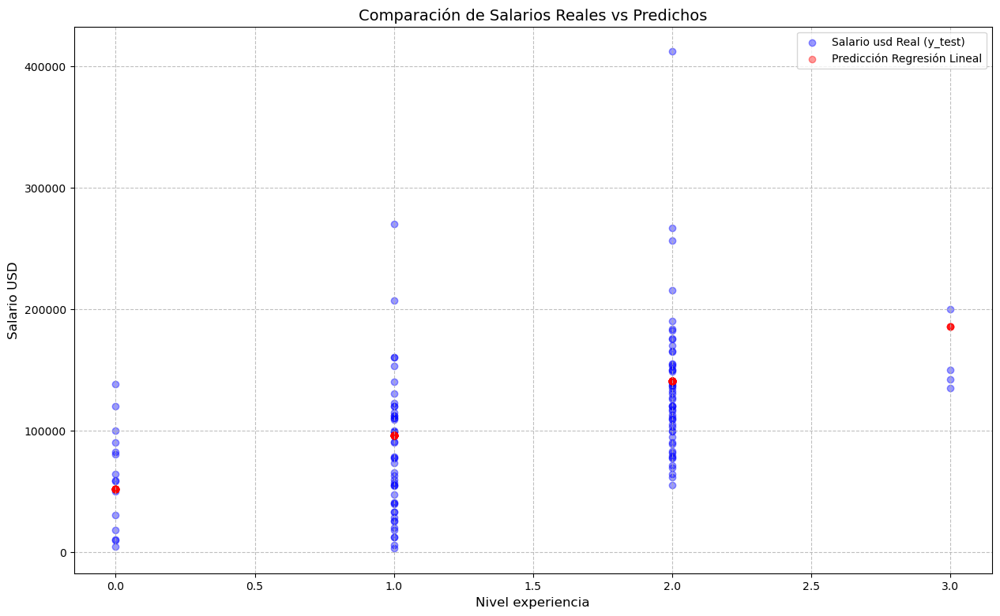

In [25]:
# Crear gráfico de dispersión para comparar valores reales y predicciones
plt.figure(figsize=(15,9 ))

# Graficar valores reales (y_test) en azul
plt.scatter(X_test, y_test, color='blue', label="Salario usd Real (y_test)", alpha=0.4)# alpha puntos transperantes

# Graficar predicciones de Regresión Lineal en rojo
plt.scatter(X_test, y_pred, color='red', label="Predicción Regresión Lineal", alpha=0.4)

# Configurar el gráfico
plt.xlabel("Nivel experiencia", fontsize=12)
plt.ylabel("Salario USD", fontsize=12)
plt.title("Comparación de Salarios Reales vs Predichos", fontsize=14)
plt.legend()
plt.grid(True, linestyle="--", alpha=0.8)

# Mostrar gráfico
plt.show()



### 4.6 calificar un modelo

* El Error Cuadrático Medio (MSE) mide cuánto se alejan las predicciones de los valores reales, calculando el promedio de los errores elevados al cuadrado. Como está en una escala diferente a los datos originales, se recomienda usar la Raíz del MSE (RMSE) para interpretarlo en la misma unidad de la variable objetivo. Un MSE bajo indica mayor precisión del modelo.
* Por otro lado, el Coeficiente de Determinación (R²) mide qué porcentaje de la variabilidad de los datos es explicado por el modelo, con valores entre 0 y 1 (o negativos si el modelo es muy malo).
* Un R² cercano a 1 indica un buen ajuste, mientras que un valor bajo sugiere que el modelo no explica bien los datos.
* Para evaluar si el MSE es grande o pequeño, se debe comparar con la variabilidad de y_test, calculando su rango y desviación estándar.

In [26]:
# Calcular el error cuadrático medio (MSE)
mse = mean_squared_error(y_test, y_pred)

# Calcular el coeficiente de determinación R^2
r2 = r2_score(y_test, y_pred)

print(f"Error cuadrático medio (MSE): {mse:.2f}")
print(f"Coeficiente de determinación (R²): {r2:.2f}")

Error cuadrático medio (MSE): 3019758135.07
Coeficiente de determinación (R²): 0.21


In [27]:
# Calcular el mínimo y máximo de y_test
min_y_test = y_test.min()
max_y_test = y_test.max()

# Calcular el rango de y_test
rango_y_test = max_y_test - min_y_test

# Calcular la desviación estándar de y_test
std_y_test= y_test.std()

#raiz cuadrada de MSE= RMSE
rmse=np.sqrt(mse)


# Mostrar los resultados

print(f"Rango de y_test: {rango_y_test:.2f}")
print(f"Desviación estándar de y_test: {std_y_test:.2f}")
print(f"Raíz de (MSE): (RMSE): {rmse:.2f}")

Rango de y_test: 409141.00
Desviación estándar de y_test: 62163.04
Raíz de (MSE): (RMSE): 54952.33


### 4.7 Interperetación

* El RMSE es menor que la desviación estándar → El modelo tiene cierto nivel de precisión.
* El R² es bajo (20%) → El modelo no explica bien los datos, lo que significa que:
* Hay otras variables importantes que no se incluyeron en el modelo.
* El modelo usado (Regresión Lineal) no es el mejor para este problema.
* Los datos pueden contener mucha aleatoriedad o ruido.

# 5 Regresión lineal múltiple

In [37]:
#dividir datos 
X = data.drop(columns=['salary_in_usd'])
y = data['salary_in_usd']
# Dividir en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# elegir modelo
modelo_lr = LinearRegression()
# Entrenar modelos
modelo_lr.fit(X_train, y_train)
# Hacer predicciones
y_pred_lr = modelo_lr.predict(X_test)


# Evaluar modelos
mse = mean_squared_error(y_test, y_pred_lr)
r2 = r2_score(y_test, y_pred_lr)
# Calcular el mínimo y máximo de y_test
min_y_test = y_test.min()
max_y_test = y_test.max()

# Calcular el rango de y_test
rango_y_test = max_y_test - min_y_test

# Calcular la desviación estándar de y_test
std_y_test= y_test.std()

#raiz cuadrada de MSE= RMSE
rmse=np.sqrt(mse)

# Mostrar los resultados

print(f"Rango de y_test: {rango_y_test:.2f}")
print(f"Desviación estándar de y_test: {std_y_test:.2f}")
print(f"Raíz de (MSE): (RMSE): {rmse:.2f}")
print(f"Coeficiente de determinación (R²): {r2:.2f}")

Rango de y_test: 409141.00
Desviación estándar de y_test: 62163.04
Raíz de (MSE): (RMSE): 52811.32
Coeficiente de determinación (R²): 0.27


In [ ]:
data= data

# 6. Ajustes de data y modelo

In [48]:
data.columns # revisar composición actual 

Index(['salary', 'salary_in_usd', 'remote_ratio_bin', 'experience_level_tr',
       'company_size_M', 'company_size_S', 'work_year', 'employment_FL',
       'employment_FT', 'employment_PT'],
      dtype='object')

In [47]:
df.columns

Index(['Unnamed: 0', 'work_year', 'experience_level', 'employment_type',
       'job_title', 'salary', 'salary_currency', 'salary_in_usd',
       'employee_residence', 'remote_ratio', 'company_location',
       'company_size'],
      dtype='object')

### 6.1 Añadir nuevas columnas

In [49]:
df["company_location"].unique() #sacar val unicos

array(['DE', 'JP', 'GB', 'HN', 'US', 'HU', 'NZ', 'FR', 'IN', 'PK', 'CN',
       'GR', 'AE', 'NL', 'MX', 'CA', 'AT', 'NG', 'ES', 'PT', 'DK', 'IT',
       'HR', 'LU', 'PL', 'SG', 'RO', 'IQ', 'BR', 'BE', 'UA', 'IL', 'RU',
       'MT', 'CL', 'IR', 'CO', 'MD', 'KE', 'SI', 'CH', 'VN', 'AS', 'TR',
       'CZ', 'DZ', 'EE', 'MY', 'AU', 'IE'], dtype=object)

In [50]:
dummies_cl = pd.get_dummies(df["company_location"], prefix="company_location", drop_first=True).astype(int)
data = pd.concat([data, dummies_cl], axis=1)
data

,salary,salary_in_usd,remote_ratio_bin,experience_level_tr,company_size_M,company_size_S,work_year,employment_FL,employment_FT,employment_PT,...,company_location_PL,company_location_PT,company_location_RO,company_location_RU,company_location_SG,company_location_SI,company_location_TR,company_location_UA,company_location_US,company_location_VN
0,70000,79833,0,1,0,0,2020,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,260000,260000,0,2,0,1,2020,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2,85000,109024,0,2,1,0,2020,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,20000,20000,0,1,0,1,2020,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,150000,150000,0,2,0,0,2020,0,1,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
602,154000,154000,1,2,1,0,2022,0,1,0,...,0,0,0,0,0,0,0,0,1,0
603,126000,126000,1,2,1,0,2022,0,1,0,...,0,0,0,0,0,0,0,0,1,0
604,129000,129000,0,2,1,0,2022,0,1,0,...,0,0,0,0,0,0,0,0,1,0
605,150000,150000,1,2,1,0,2022,0,1,0,...,0,0,0,0,0,0,0,0,1,0


### 6.2 Eliminar columnas

In [66]:
data= data.drop(columns=['salary'])
data

,salary_in_usd,remote_ratio_bin,experience_level_tr,company_size_M,company_size_S,work_year,employment_FL,employment_FT,employment_PT,company_location_AS,...,company_location_PL,company_location_PT,company_location_RO,company_location_RU,company_location_SG,company_location_SI,company_location_TR,company_location_UA,company_location_US,company_location_VN
0,79833,0,1,0,0,2020,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,260000,0,2,0,1,2020,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,109024,0,2,1,0,2020,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,20000,0,1,0,1,2020,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,150000,0,2,0,0,2020,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
602,154000,1,2,1,0,2022,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
603,126000,1,2,1,0,2022,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
604,129000,0,2,1,0,2022,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
605,150000,1,2,1,0,2022,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0


### 6.3 Graficar correlación de variables

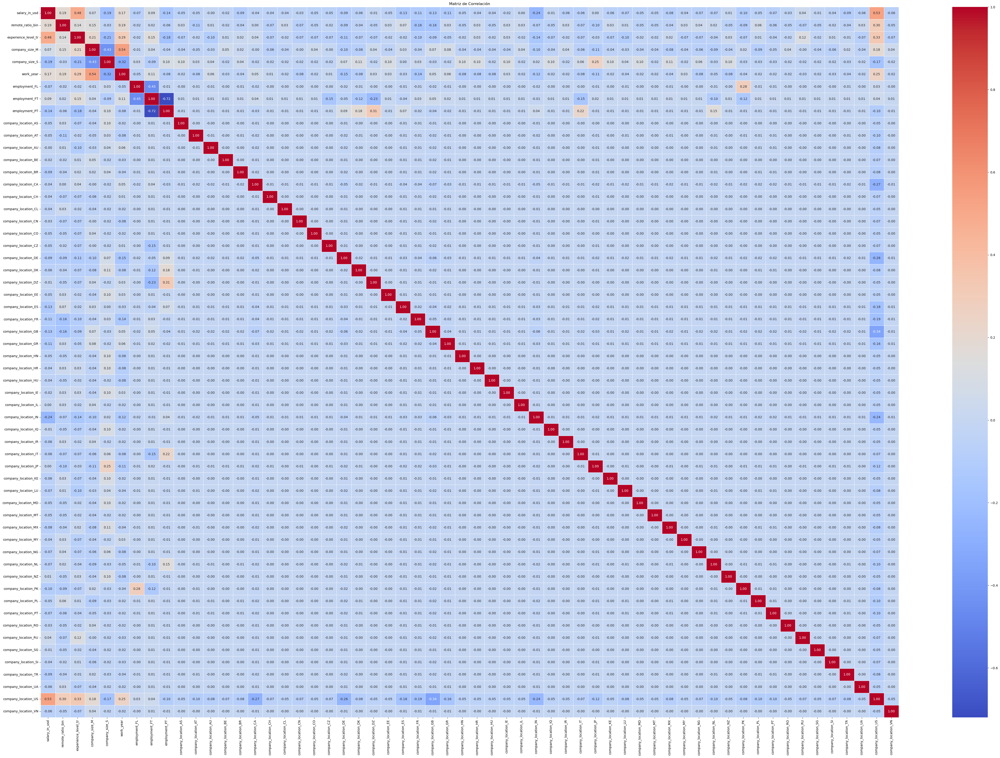

In [67]:
# graficad
correlacion = data.corr()
# 🔹 Crear el mapa de calor
plt.figure(figsize=(60, 40)) 
sns.heatmap(correlacion, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)

# 🔹 Título del gráfico
plt.title("Matriz de Correlación")

# 🔹 Mostrar el gráfico
plt.show()

### 6.4 Aplicar modelo

In [84]:
# Separar variables predictoras y objetivo
X = data.drop(columns=['salary_in_usd'])
y = data['salary_in_usd']
# Dividir en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
#elegir modelo
modelo_lr_multiple = LinearRegression()
# Entrenar modelos
modelo_lr_multiple.fit(X_train, y_train)
# Hacer predicciones
y_pred_lr = modelo_lr_multiple.predict(X_test)
# Evaluar modelos
mse = mean_squared_error(y_test, y_pred_lr)
r2 = r2_score(y_test, y_pred_lr)
# Calcular el mínimo y máximo de y_test
min_y_test = y_test.min()
max_y_test = y_test.max()

# Calcular el rango de y_test
rango_y_test = max_y_test - min_y_test

# Calcular la desviación estándar de y_test
std_y_test= y_test.std()

#raiz cuadrada de MSE= RMSE
rmse=np.sqrt(mse)

# Mostrar los resultados

print(f"Rango de y_test: {rango_y_test:.2f}")
print(f"Desviación estándar de y_test: {std_y_test:.2f}")
print(f"Raíz de (MSE): (RMSE): {rmse:.2f}")
print(f"Coeficiente de determinación (R²): {r2:.2f}")


Rango de y_test: 409141.00
Desviación estándar de y_test: 62163.04
Raíz de (MSE): (RMSE): 45017.15
Coeficiente de determinación (R²): 0.47


### 6.5 Graficar dispersión

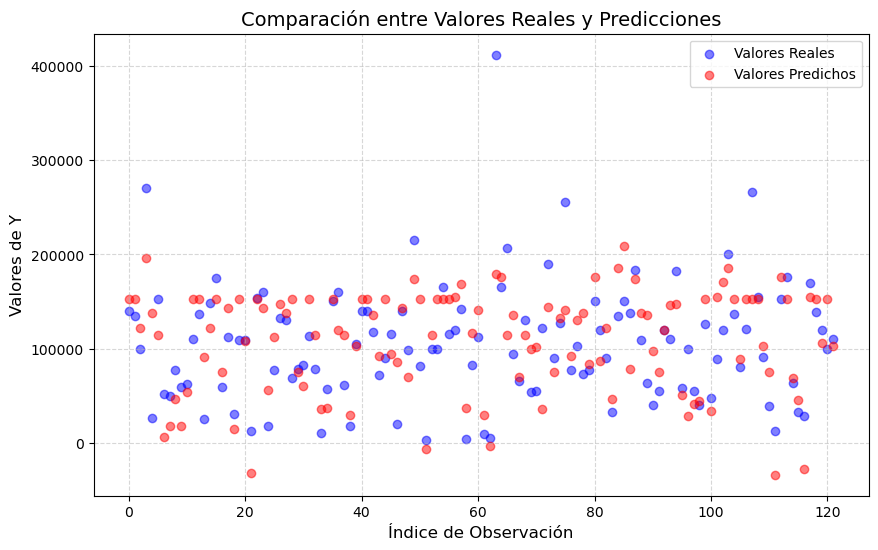

In [69]:
plt.figure(figsize=(10, 6))

# Graficar cada punto (valor real vs predicho)
plt.scatter(range(len(y_test)), y_test, color='blue', label="Valores Reales", alpha=0.5)
plt.scatter(range(len(y_pred_lr)), y_pred_lr, color='red', label="Valores Predichos", alpha=0.5)

# Configurar el gráfico
plt.xlabel("Índice de Observación", fontsize=12)
plt.ylabel("Valores de Y", fontsize=12)
plt.title("Comparación entre Valores Reales y Predicciones", fontsize=14)
plt.legend()
plt.grid(True, linestyle="--", alpha=0.5)

# Mostrar gráfico
plt.show()

### 6.6 Almacenar la nueva data

In [78]:
data.to_csv(r"C:\Users\darly\OneDrive\Escritorio\IA_explorer2\dataSet\data_preprocesada_2.csv", index=False)  # index=False evita guardar los índices


### 6.7 Hacer algunas pruebas 

**Vamos a probar algunos cambios, para verificar si aporta algo al modelo. pero no sobre la data almacenada 
#sino una que no se guardará o se tendra como candidata sin antes mejorar el modelo**

#### 6.7.1 Añadir columnas y probar el modelo

In [72]:
#agregar nuevas columnas, 
dummies = pd.get_dummies(df["employment_type"], prefix="employment", drop_first=True).astype(int)
d_ = pd.concat([data, dummies], axis=1)
d_

,salary_in_usd,remote_ratio_bin,experience_level_tr,company_size_M,company_size_S,work_year,employment_FL,employment_FT,employment_PT,company_location_AS,...,company_location_RU,company_location_SG,company_location_SI,company_location_TR,company_location_UA,company_location_US,company_location_VN,employment_FL,employment_FT,employment_PT
0,79833,0,1,0,0,2020,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
1,260000,0,2,0,1,2020,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
2,109024,0,2,1,0,2020,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
3,20000,0,1,0,1,2020,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
4,150000,0,2,0,0,2020,0,1,0,0,...,0,0,0,0,0,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
602,154000,1,2,1,0,2022,0,1,0,0,...,0,0,0,0,0,1,0,0,1,0
603,126000,1,2,1,0,2022,0,1,0,0,...,0,0,0,0,0,1,0,0,1,0
604,129000,0,2,1,0,2022,0,1,0,0,...,0,0,0,0,0,1,0,0,1,0
605,150000,1,2,1,0,2022,0,1,0,0,...,0,0,0,0,0,1,0,0,1,0


In [73]:
#probar un modelo

# Separar variables predictoras y objetivo
X = d_.drop(columns=['salary_in_usd'])
y = d_['salary_in_usd']
# Dividir en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
#elegir modelo
modelo_lr = LinearRegression()
# Entrenar modelos
modelo_lr.fit(X_train, y_train)
# Hacer predicciones
y_pred_lr = modelo_lr.predict(X_test)
# Evaluar modelos
mse = mean_squared_error(y_test, y_pred_lr)
r2 = r2_score(y_test, y_pred_lr)
# Calcular el mínimo y máximo de y_test
min_y_test = y_test.min()
max_y_test = y_test.max()

# Calcular el rango de y_test
rango_y_test = max_y_test - min_y_test

# Calcular la desviación estándar de y_test
std_y_test= y_test.std()

#raiz cuadrada de MSE= RMSE
rmse=np.sqrt(mse)

# Mostrar los resultados

print(f"Rango de y_test: {rango_y_test:.2f}")
print(f"Desviación estándar de y_test: {std_y_test:.2f}")
print(f"Raíz de (MSE): (RMSE): {rmse:.2f}")
print(f"Coeficiente de determinación (R²): {r2:.2f}")

Rango de y_test: 409141.00
Desviación estándar de y_test: 62163.04
Raíz de (MSE): (RMSE): 45017.15
Coeficiente de determinación (R²): 0.47


#### 6.7.2 Eliminar atipicos y probar modelo

* El rango intercuartílico es una medida estadística de dispersión que describe el rango en el que se encuentra el 50% central de los datos. Se calcula como la diferencia entre el tercer cuartil (Q3) y el primer cuartil (Q1), es decir, IQR = Q3 - Q1. Este rango es útil para identificar y eliminar valores atípicos (outliers), ya que los datos que se encuentran muy lejos del centro de la distribución pueden distorsionar los análisis. En este caso, se usa el IQR para filtrar los outliers en la columna salary_in_usd.

* La primera línea del código, Q1, Q3 = data['salary_in_usd'].quantile([0.25, 0.75]), calcula el primer y tercer cuartil de la columna de salarios en dólares. El cuartil 1 (Q1) representa el valor por debajo del cual se encuentra el 25% de los datos, mientras que el cuartil 3 (Q3) representa el valor por debajo del cual se encuentra el 75% de los datos.

* En la segunda línea, IQR = Q3 - Q1, se calcula el rango intercuartílico como la diferencia entre Q3 y Q1, lo cual representa el rango que contiene el 50% de los datos centrales.

* La tercera línea, df_final_1 = df_final_1[(data['salary_in_usd'] >= (Q1 - 1.5 * IQR)) & (data['salary_in_usd'] <= (Q3 + 1.5 * IQR))], filtra el DataFrame original, conservando únicamente las filas en las que el salario se encuentra dentro del rango permitido. Este rango se define entre Q1 menos 1.5 veces el IQR y Q3 más 1.5 veces el IQR. Los valores fuera de este rango se consideran outliers y se eliminan del conjunto de datos.

* Este proceso permite limpiar los datos eliminando valores extremos que podrían afectar negativamente el análisis estadístico o el entrenamiento de modelos predictivos.

In [79]:
# Filtrar outliers en salario usando IQR
Q1, Q3 = data['salary_in_usd'].quantile([0.25, 0.75])
IQR = Q3 - Q1
d1 = data[(data['salary_in_usd'] >= (Q1 - 1.5 * IQR)) & (data['salary_in_usd'] <= (Q3 + 1.5 * IQR))]

In [80]:
d1.shape #cambios en el tamaño

(597, 58)

In [81]:
data.shape[0]- d1.shape[0]  #numero de datos eliminados


10

In [83]:
#probar modelo 

# Separar variables predictoras y objetivo
X = d1.drop(columns=['salary_in_usd'])
y = d1['salary_in_usd']
# Dividir en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
#elegir modelo
modelo_lr = LinearRegression()
# Entrenar modelos
modelo_lr.fit(X_train, y_train)
# Hacer predicciones
y_pred_lr = modelo_lr.predict(X_test)
# Evaluar modelos
mse = mean_squared_error(y_test, y_pred_lr)
r2 = r2_score(y_test, y_pred_lr)
# Calcular el mínimo y máximo de y_test
min_y_test = y_test.min()
max_y_test = y_test.max()

# Calcular el rango de y_test
rango_y_test = max_y_test - min_y_test

# Calcular la desviación estándar de y_test
std_y_test= y_test.std()

#raiz cuadrada de MSE= RMSE
rmse=np.sqrt(mse)

# Mostrar los resultados

print(f"Rango de y_test: {rango_y_test:.2f}")
print(f"Desviación estándar de y_test: {std_y_test:.2f}")
print(f"Raíz de (MSE): (RMSE): {rmse:.2f}")
print(f"Coeficiente de determinación (R²): {r2:.2f}")

Rango de y_test: 270118.00
Desviación estándar de y_test: 51826.73
Raíz de (MSE): (RMSE): 39663.03
Coeficiente de determinación (R²): 0.41


**Como se puede observar los cambios efectuados no mejoran el modelo, al contrario, en algunos casos lo perjudica.**

### 6.8 Almacenar un modelo

In [86]:
# Guardar el modelo 1
joblib.dump(modelo_lr_multiple, r'C:\Users\darly\OneDrive\Escritorio\IA_explorer2\modelos\modelo_lr_multiple.pkl')

['C:\\Users\\darly\\OneDrive\\Escritorio\\IA_explorer2\\modelos\\modelo_lr_multiple.pkl']